<a href="https://colab.research.google.com/github/pscabral/Prezunic/blob/main/ProjIFMASOFTEX_V02F.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.applications.vgg19 import preprocess_input
from keras.applications.vgg19 import decode_predictions
from keras.applications.vgg19 import VGG19
import matplotlib.pyplot as plt

# load the model
model = VGG19()

# load an image from file
image = load_img('/content/abacaxi1.jpg', target_size=(224, 224))

# Display the image
plt.imshow(image)
plt.axis('off')  # Remove os eixos (bordas) da imagem
plt.show()

# convert the image pixels to a numpy array
image = img_to_array(image)

# reshape data for the model
image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))

# prepare the image for the VGG model
image = preprocess_input(image)

# predict the probability across all output classes
yhat = model.predict(image)

# convert the probabilities to class labels
label = decode_predictions(yhat)

# retrieve the most likely result, e.g. highest probability
label = label[0][0]

# print the classification
print('%s (%.2f%%)' % (label[1], label[2]*100))

In [ ]:
import os
import numpy as np
from PIL import Image
from keras.applications.vgg19 import VGG19, preprocess_input
from keras.models import Model
from keras.layers import Dense, GlobalAveragePooling2D, Dropout
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix

# Caminhos para diretórios de treinamento e teste
diretorio_treinamento = '/content/dataset/train/banana'
diretorio_teste = '/content/dataset/test/banana'

# Função para carregar imagens de um diretório
def carregar_imagens(diretorio):
    imagens = os.listdir(diretorio)
    X = []
    y = []

    for imagem_nome in imagens:
        caminho_imagem = os.path.join(diretorio, imagem_nome)
        try:
            img = Image.open(caminho_imagem)
            img = img.resize((224, 224))
            img = np.array(img)
            img = preprocess_input(img)
            X.append(img)
            y.append(imagem_nome)  # Nome da imagem como rótulo
        except:
            print(f"Erro ao carregar: {caminho_imagem}")

    return X, y

# Carregar imagens de treinamento e teste
X_train, y_train = carregar_imagens(diretorio_treinamento)
X_test, y_test = carregar_imagens(diretorio_teste)

X_train = np.array(X_train)
X_test = np.array(X_test)

# Codificar os rótulos em números
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)

# Carregar o modelo VGG19 pré-treinado com pesos do ImageNet
base_model = VGG19(weights='imagenet', include_top=False)

# Adicionar camadas personalizadas para a tarefa de classificação
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)  # Adicionar regularização de dropout
predictions = Dense(len(label_encoder.classes_), activation='softmax')(x)

# Criar o modelo final
model = Model(inputs=base_model.input, outputs=predictions)

# Congelar as camadas convolucionais para usar os pesos pré-treinados
for layer in base_model.layers:
    layer.trainable = False

# Compilar o modelo
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Treinar o modelo
history = model.fit(X_train, y_train_encoded, epochs=10, batch_size=32, validation_split=0.2)

# Visualizar as curvas de aprendizado
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Curvas de Aprendizado')
plt.xlabel('Época')
plt.ylabel('Acurácia')
plt.legend(['Treinamento', 'Validação'], loc='upper left')
plt.show()

# Avaliar o modelo no conjunto de teste
loss, accuracy = model.evaluate(X_test, y_test_encoded)
print(f'Acurácia no conjunto de teste: {accuracy * 100:.2f}%')

# Gerar relatório de classificação
y_pred = model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)
class_names = label_encoder.classes_
print(classification_report(y_test_encoded, y_pred_classes, target_names=class_names))

# Matriz de confusão
confusion_mtx = confusion_matrix(y_test_encoded, y_pred_classes)
print(confusion_mtx)

# Salvar o modelo treinado
model.save('vgg19_model.h5')

print("Modelo treinado foi salvo com sucesso como 'vgg19_model.h5'")

1/1 [==============================] - 1s 962ms/step


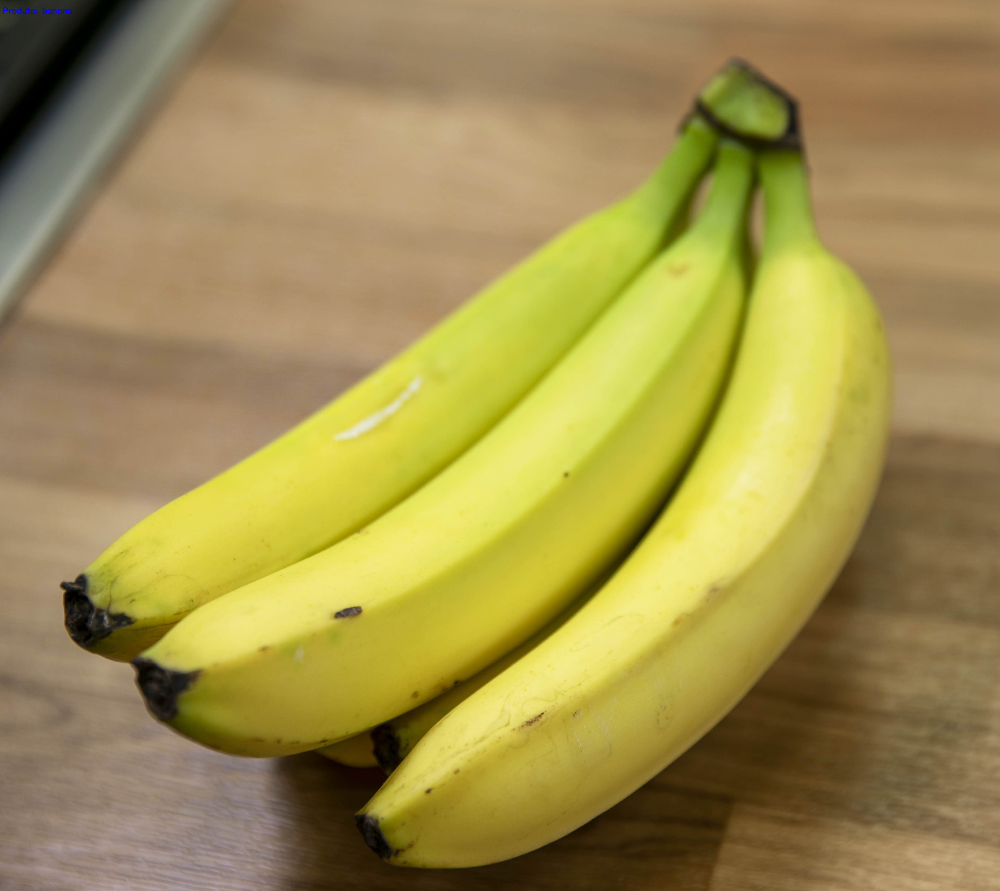

In [ ]:
#!pip install gTTS
import cv2
import numpy as np
from keras.applications.vgg19 import preprocess_input
from keras.applications.vgg19 import VGG19
from keras.models import load_model
from gtts import gTTS
import IPython.display as ipd
from google.colab.patches import cv2_imshow
import os

# Carregar o modelo VGG19
model = VGG19(weights='imagenet')

# Caminho para a imagem de teste (substitua pelo caminho da sua imagem)
caminho_imagem_teste = '/content/Bananas_(Alabama_Extension).jpg'

# Ler a imagem de teste
image = cv2.imread(caminho_imagem_teste)

# Redimensionar a imagem para o tamanho esperado pelo modelo VGG19 (224x224)
image_resized = cv2.resize(image, (224, 224))

# Pré-processamento específico do VGG19
image_preprocessed = preprocess_input(image_resized)

# Fazer a previsão usando o modelo VGG19
predicted_label = model.predict(np.expand_dims(image_preprocessed, axis=0))

# Obter o ID da classe prevista
predicted_class_id = np.argmax(predicted_label)

# Obter o nome da classe a partir do ID da classe usando a base de dados do ImageNet
from keras.applications.vgg19 import decode_predictions
predicted_class = decode_predictions(predicted_label, top=1)[0][0][1]

# Exibir a imagem com a previsão
font = cv2.FONT_HERSHEY_SIMPLEX
cv2.putText(image, f'Produto: {predicted_class}', (10, 50), font, 1, (255, 0, 0), 2, cv2.LINE_AA)
cv2_imshow(image)

# Gerar o arquivo de áudio com o nome do produto previsto
tts = gTTS(text=f'O produto é {predicted_class}', lang='pt')
tts.save('/content/prevision.mp3')

# Reproduzir o arquivo de áudio
ipd.Audio('/content/prevision.mp3')

<IPython.core.display.Javascript object>

1/1 [==============================] - 2s 2s/step


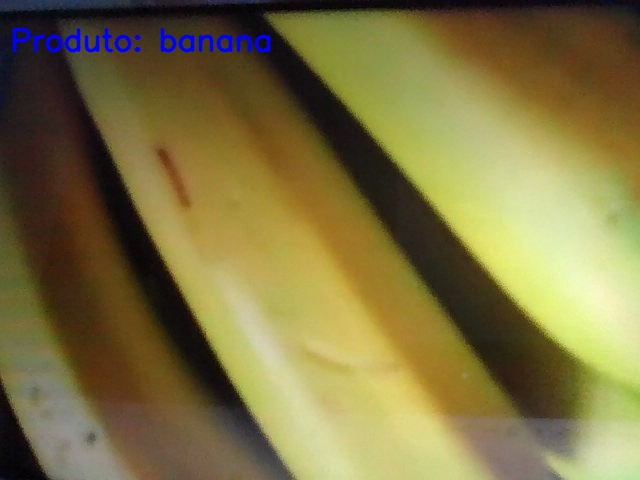

In [18]:
from IPython.display import display, Javascript, Image
from google.colab.output import eval_js
from base64 import b64decode
import cv2
import numpy as np
from keras.applications.vgg19 import preprocess_input
from keras.models import load_model

# Carregar o modelo VGG19 treinado
model = load_model('/content/vgg19_model.h5')  # Substitua 'path_to_vgg19_model.h5' pelo caminho correto

# Definir a função JavaScript para capturar a imagem
js = Javascript('''
async function captureImage() {
    const div = document.createElement('div');
    const capture = document.createElement('button');
    capture.textContent = 'Capture Image';
    div.appendChild(capture);

    const video = document.createElement('video');
    video.style.display = 'block';
    const stream = await navigator.mediaDevices.getUserMedia({ video: true });

    document.body.appendChild(div);
    div.appendChild(video);
    video.srcObject = stream;
    await video.play();

    // Resize the output to fit the video element.
    google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

    // Wait for Capture Image to be clicked.
    await new Promise((resolve) => capture.onclick = resolve);

    const canvas = document.createElement('canvas');
    canvas.width = video.videoWidth;
    canvas.height = video.videoHeight;
    canvas.getContext('2d').drawImage(video, 0, 0);
    stream.getVideoTracks()[0].stop();
    div.remove();
    return canvas.toDataURL('image/jpeg');
}
''')

display(js)

def capture_and_classify():
    data = eval_js('captureImage()')
    binary = b64decode(data.split(',')[1])

    # Salvar a imagem temporariamente
    with open('temp.jpg', 'wb') as f:
        f.write(binary)

    # Ler a imagem capturada
    image = cv2.imread('temp.jpg')

    # Redimensionar a imagem para o tamanho esperado pelo modelo VGG19 (224x224)
    image_resized = cv2.resize(image, (224, 224))

    # Pré-processamento específico do VGG19
    image_preprocessed = preprocess_input(np.expand_dims(image_resized, axis=0))

    # Fazer a previsão usando o modelo VGG19
    predicted_label = model.predict(image_preprocessed)

    # Aqui, você deve adicionar código para mapear o rótulo previsto para o nome do produto real.
    # Por exemplo:
    predicted_product = 'Produto X' if predicted_label[0][0] > 0.5 else 'Produto Y'

    # Exibir o nome do produto previsto na imagem
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(image, f'Produto: {predicted_class}', (10, 50), font, 1, (255, 0, 0), 2, cv2.LINE_AA)

    # Salvar a imagem com a previsão em um arquivo temporário
    cv2.imwrite('temp_result.jpg', image)

    # Exibir a imagem com a previsão usando IPython.display
    display(Image(filename='temp_result.jpg'))

    # Remover as imagens temporárias
    import os
    os.remove('temp.jpg')
    os.remove('temp_result.jpg')

capture_and_classify()

In [25]:
!apt-get install libzbar0
!pip install pyzbar
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode
from pyzbar.pyzbar import decode
import cv2
import numpy as np

def capture_barcode():
    js = Javascript('''
    async function captureBarcode() {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Wait for Capture to be clicked.
      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg');
    }
    ''')

    display(js)
    data = eval_js('captureBarcode()')
    binary = b64decode(data.split(',')[1])

    # Salvar a imagem temporariamente
    with open('temp.jpg', 'wb') as f:
        f.write(binary)

    # Ler o código de barras na imagem
    image = cv2.imread('temp.jpg', 0)
    decoded_objects = decode(image)
    if decoded_objects:
        for obj in decoded_objects:
            barcode_data = obj.data.decode('utf-8')
            print('Código de barras lido:', barcode_data)
    else:
        print('Nenhum código de barras foi detectado.')

    # Remover a imagem temporária
    import os
    os.remove('temp.jpg')

capture_barcode()

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  fonts-droid-fallback fonts-noto-mono fonts-urw-base35 ghostscript gsfonts imagemagick-6-common
  libdjvulibre-text libdjvulibre21 libfftw3-double3 libgs9 libgs9-common libidn12 libijs-0.35
  libjbig2dec0 libjxr-tools libjxr0 liblqr-1-0 libmagickcore-6.q16-6 libmagickcore-6.q16-6-extra
  libmagickwand-6.q16-6 libv4l-0 libv4lconvert0 libwmflite-0.2-7 poppler-data
Suggested packages:
  fonts-noto fonts-freefont-otf | fonts-freefont-ttf fonts-texgyre ghostscript-x libfftw3-bin
  libfftw3-dev inkscape poppler-utils fonts-japanese-mincho | fonts-ipafont-mincho
  fonts-japanese-gothic | fonts-ipafont-gothic fonts-arphic-ukai fonts-arphic-uming fonts-nanum
The following NEW packages will be installed:
  fonts-droid-fallback fonts-noto-mono fonts-urw-base35 ghostscript gsfonts imagemagick-6-common
  libdjvulibre-text libdjvulibre21 libfftw3-doub

<IPython.core.display.Javascript object>

Nenhum código de barras foi detectado.
